<div style="text-align:center; font-size: 30px">ML SONG GENRE CLASSIFICATION PROJECT</div>

In [1]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from glob import glob

import librosa
import librosa.display
import IPython.display as ipd
from functions import Input

<div style="font-size: 20px">Assign and Load Audio Files</div>

In [2]:
# Assign variable names to genres
blues_files = glob("../audio-ml/Data/genres_original/blues/blues.*.wav")
# blues_files[:3]

classical_files = glob("../audio-ml/Data/genres_original/classical/classical.*.wav")
# classical_files[:3]

country_files = glob("../audio-ml/Data/genres_original/country/country.*.wav")
# country_files[:3]

disco_files = glob("../audio-ml/Data/genres_original/disco/disco.*.wav")
# disco_files[:3]

hiphop_files = glob("../audio-ml/Data/genres_original/hiphop/hiphop.*.wav")
# hiphop_files[:3]

jazz_files = glob("../audio-ml/Data/genres_original/jazz/jazz.*.wav")
# jazz_files[:3]

metal_files = glob("../audio-ml/Data/genres_original/metal/metal.*.wav")
# metal_files[:3]

pop_files = glob("../audio-ml/Data/genres_original/pop/pop.*.wav")
# pop_files[:3]

reggae_files = glob("../audio-ml/Data/genres_original/reggae/reggae.*.wav")
# reggae_files[:3]

rock_files = glob("../audio-ml/Data/genres_original/rock/rock.*.wav")
# rock_files[:3]

In [3]:
# Play example Audio file
ipd.Audio(pop_files[1])

<div style="font-size: 45px">Genre 1: POP</div>

In [4]:
# Load one file, print features
y, sr = librosa.load(pop_files[1], sr=None)
print(f"y: {y[:5]}")
print(f"y shape: {y.shape}")
print(f"sampling rate: {sr}")

y: [-0.13864136  0.14367676 -0.15341187 -0.006073    0.07800293]
y shape: (661504,)
sampling rate: 22050


<div style="font-size: 20px">Visualizations</div>

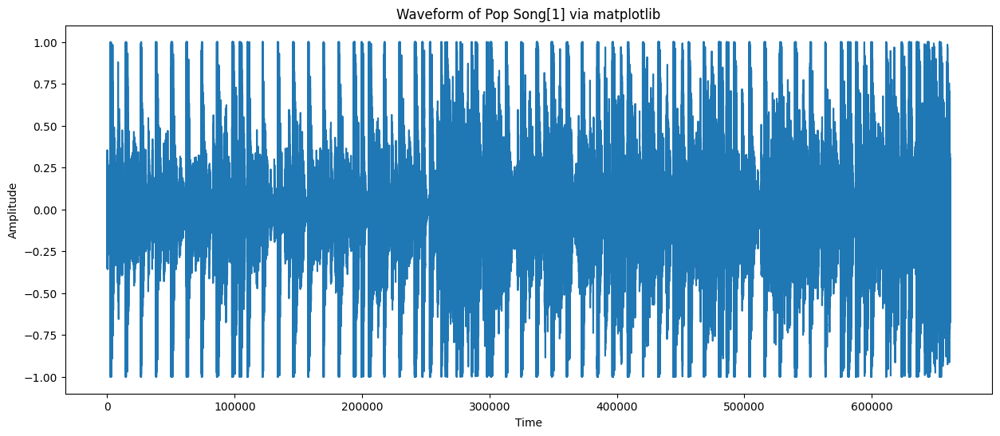

In [5]:
plt.figure(figsize=(15, 6))
plt.plot(y)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Waveform of Pop Song[1] via matplotlib");

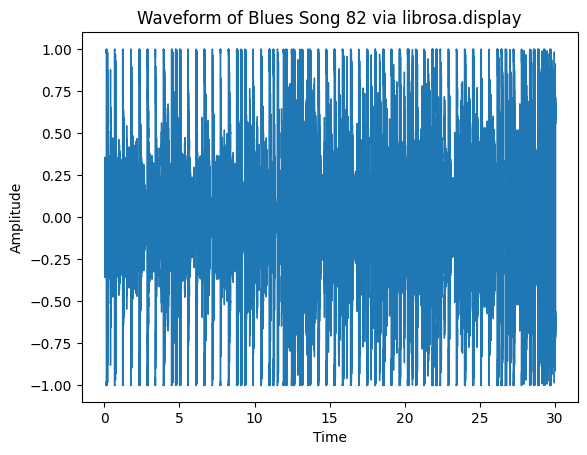

In [6]:
# Plot audio waveform using librosa.display
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform of Blues Song 82 via librosa.display")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

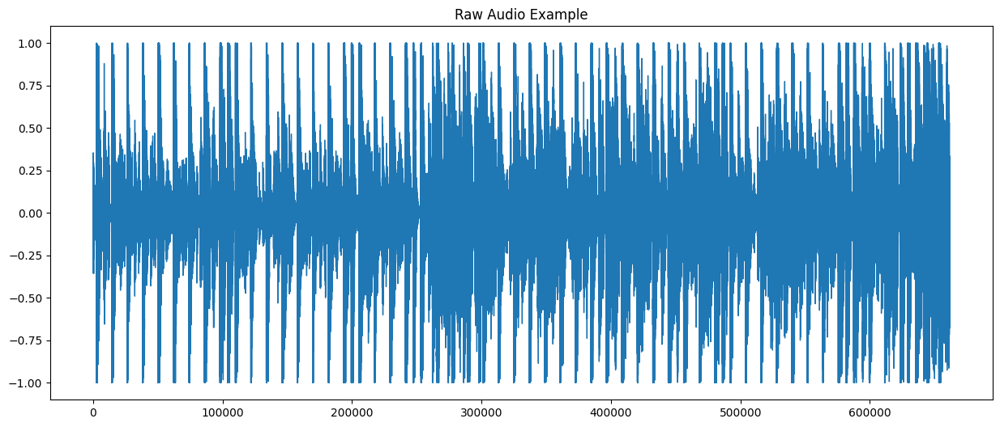

In [7]:
pd.Series(y).plot(figsize=(15, 6),
                  lw=1, 
                  title="Raw Audio Example");

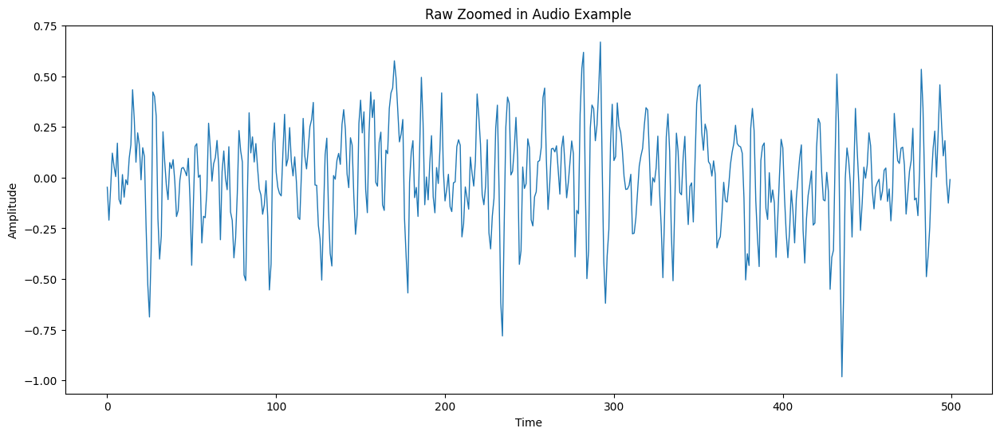

In [8]:
pd.Series(y[100000: 100500]).plot(figsize=(15, 6),
                                  lw=1,
                                  title="Raw Zoomed in Audio Example")
plt.xlabel("Time")
plt.ylabel("Amplitude");

In [9]:
# Amplify the signal
y_amplified = y*1.5
print(y_amplified[:5])

[-0.20796204  0.21551514 -0.2301178  -0.0091095   0.11700439]


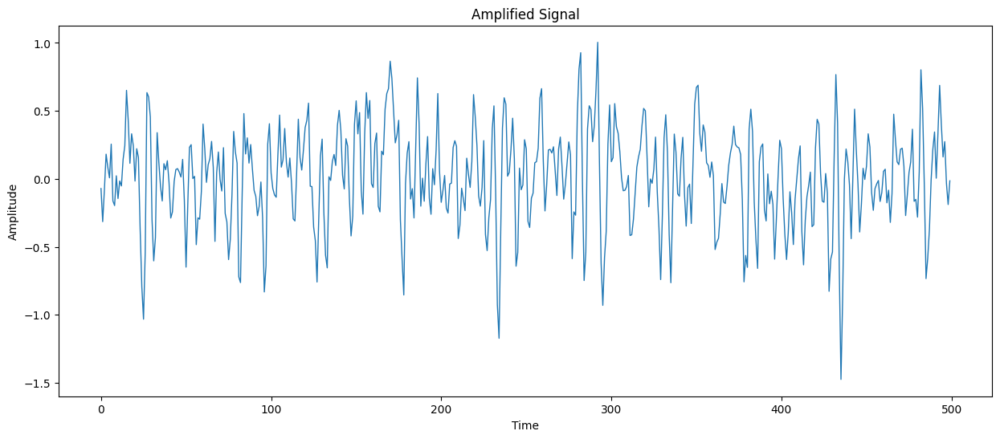

In [10]:
# Amplified signal plot zoomed in
plt.figure(figsize=(15,6))
plt.plot(y_amplified[100000: 100500], lw=1)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Amplified Signal");

In [11]:
# Attenuated signal
y_attenuated = y*0.5
print(y_attenuated[:5])

[-0.06932068  0.07183838 -0.07670593 -0.0030365   0.03900146]


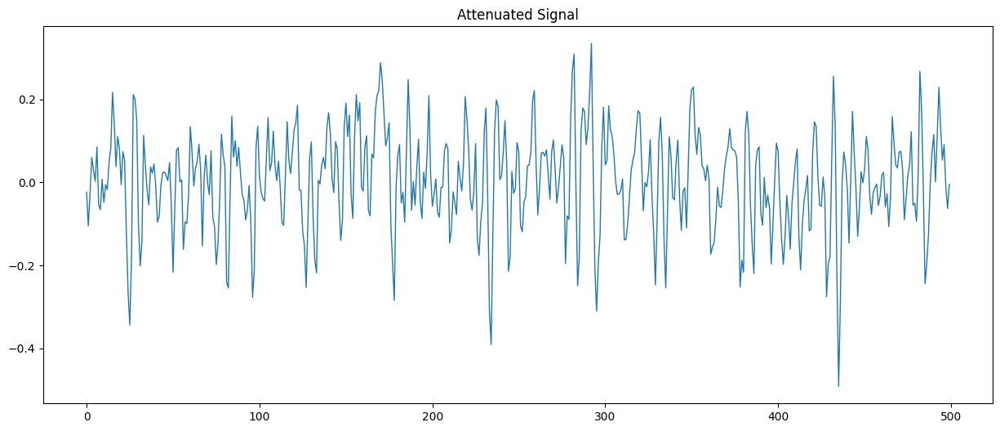

In [12]:
# Attenuated signal plot zoomed in
plt.figure(figsize=(15,6))
plt.plot(y_attenuated[100000: 100500], lw=1)
plt.title("Attenuated Signal");

**Only the relative amplitudes change**

In [13]:
# Librosa.load documentation
# librosa.load?

In [14]:
# Max value
max_val = np.max(y)
max_val

np.float32(0.9999695)

In [15]:
# Listen to Amplified Audio
ipd.Audio(data=y_amplified, rate=22050)

In [16]:
# Listen to Attenuated Audio
ipd.Audio(y_attenuated, rate=22050)

In [17]:
# Compare with Normal
ipd.Audio(data=y, rate=22050)

**I feel like they sound the same**

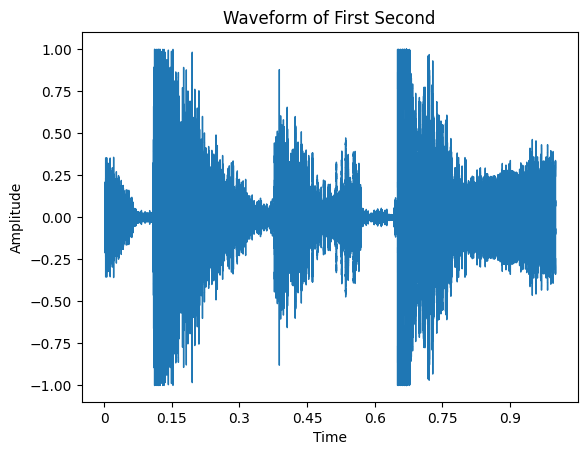

In [18]:
# Plot the first second
librosa.display.waveshow(y[:sr], sr=sr)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Waveform of First Second");

In [19]:
# Listen to first second
ipd.Audio(y[:sr], rate=sr)

In [20]:
# Basic stats
mean = np.mean(y)
print(f"y mean: {mean}")
print(f"max amplitude: {max_val}")

y mean: -0.00024345425481442362
max amplitude: 0.999969482421875


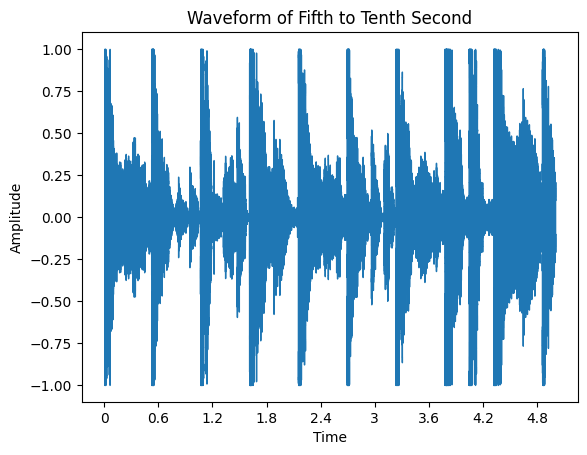

In [21]:
# Plot 5-10 seconds
librosa.display.waveshow(y[sr*5:sr*10], sr=sr)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Waveform of Fifth to Tenth Second");

In [22]:
# Listen to 5-10 seconds
ipd.Audio(y[sr*5: sr*10], rate=sr)

In [23]:
# Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
print(f'Estimated tempo: {round(float(tempo), 2)} beats per minute')

Estimated tempo: 112.35 beats per minute


/tmp/ipykernel_13446/4104819403.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f'Estimated tempo: {round(float(tempo), 2)} beats per minute')


<div style="text-align:center; font-size: 30px">SHORT-TERM FOURIER TRANSFORM(STFT)</div>

In [24]:
# librosa.stft documentation
# librosa.stft?

In [25]:
# Actual stft--returns a complex-valued matrix
stft_result = librosa.stft(y, n_fft=2048, hop_length=512)

In [26]:
# Examine the output
print(f"Output shape: {stft_result.shape}") # Notice rows correspond to n_fft // 2 + 1, columns to timeframes
print(f"Output type: {type(stft_result)}")
print(f"Output data type: {stft_result.dtype}")

Output shape: (1025, 1293)
Output type: <class 'numpy.ndarray'>
Output data type: complex64


In [27]:
# Estimating number of frames
num_frames = 1 + (len(y) - 2048) // 512 # 1+(len(y)-n_fft)//hop_length
num_frames

1289

<div style="text-align:center; font-size: 30px">SPECTROGRAMS</div>

In [28]:
# Calculate Spectrograms
mag_spec = np.abs(stft_result) # Magnitude Spectrogram --- np.abs() calculates magnitude from each complex number
pow_spec = mag_spec**2 # Power Spectrogram

In [29]:
# librosa.amplitude_to_db documentation
# librosa.amplitude_to_db?

In [30]:
# Convert mag_spec from linear-scale to db which is logarithmic
mag_db = librosa.amplitude_to_db(mag_spec, ref=np.max)

In [31]:
# Examine output
print(f"Mag_db shape: {mag_db.shape}") # Same as mag_spec
print(f"Mag_db type: {type(mag_db)}")
print(f"Mag_db data type: {mag_db.dtype}") # No longer complex

Mag_db shape: (1025, 1293)
Mag_db type: <class 'numpy.ndarray'>
Mag_db data type: float32


In [32]:
# librosa.power_to_db documentation
# librosa.power_to_db?

In [33]:
# Convert pow_spec to db
pow_db = librosa.power_to_db(pow_spec, ref=np.max) # corrected from amplitude_to_db

In [34]:
# Examine Output
print(f"pow_db shape: {pow_db.shape}") # Same as pow_spec
print(f"pow_db type: {type(pow_db)}")
print(f"pow_db data type: {pow_db.dtype}") # No longer complex

pow_db shape: (1025, 1293)
pow_db type: <class 'numpy.ndarray'>
pow_db data type: float32


<div style="font-size: 20px">Spectrogram Visualizations</div>

In [35]:
# librosa.display.specshow documentation
# librosa.display.specshow?

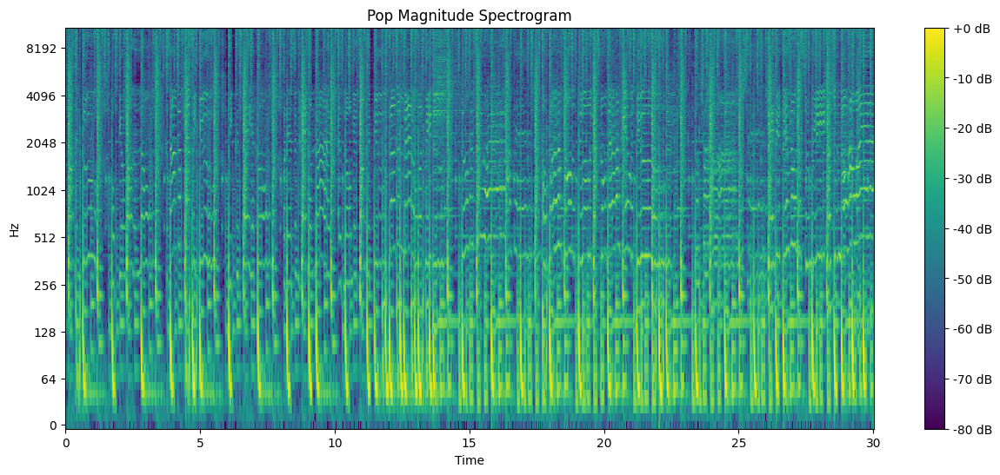

In [36]:
# Magnitude Spectrogram Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(data=mag_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="log",
                         cmap="viridis") # Changed from 'magma'
plt.colorbar(format='%+2.0f dB')
plt.title("Pop Magnitude Spectrogram");

In [37]:
# Recall and compare the actual audio
ipd.Audio(data=y, rate=22050)

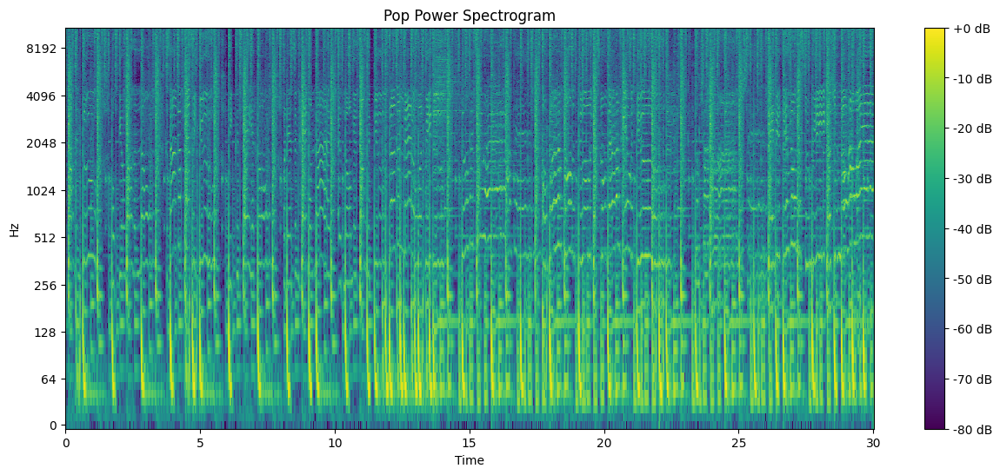

In [38]:
# Power Spectrogram Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(data=pow_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="log",
                         cmap="viridis")
plt.colorbar(format='%+2.0f dB')
plt.title("Pop Power Spectrogram");

<div style="text-align:center; font-size: 30px">MEL SPECTROGRAMS</div>

In [39]:
# librosa.feature.melspectrogram documentation
# librosa.feature.melspectrogram?

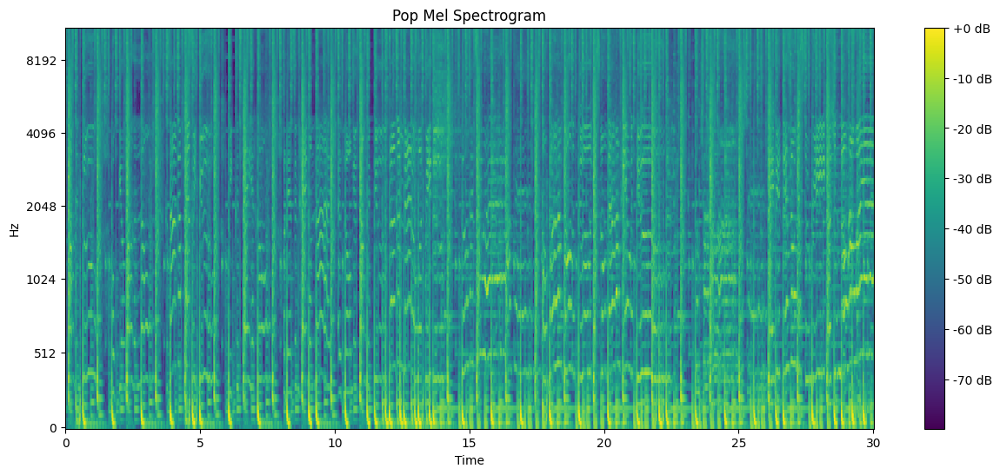

In [40]:
# Initiate Mel Spectrogram
mel_spec = librosa.feature.melspectrogram(y=y, sr=22050, n_fft=2048, hop_length=512, n_mels=128)
# Scale to db
mel_db = librosa.power_to_db(mel_spec, ref=np.max)
# Mel Spectrogram Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(data=mel_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis")
plt.colorbar(format='%+2.0f dB')
plt.title("Pop Mel Spectrogram");

In [41]:
# Closer examination of mel_spec
print(f"mel_spec shape: {mel_spec.shape}") # Rows correspond to n_mels value

mel_spec shape: (128, 1293)


<div style="font-size: 20px">Side-by-Side Spectrogram Visualizations</div>

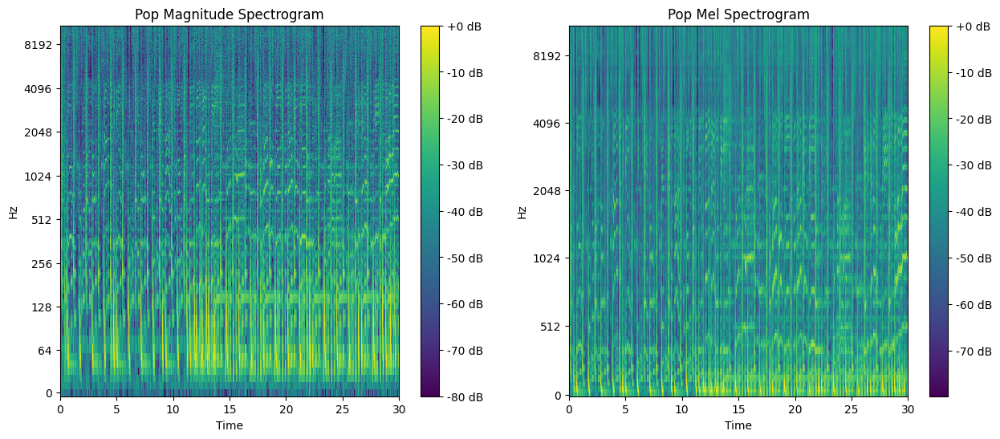

In [42]:
fig, axs = plt.subplots(1, 2,figsize=(15, 6))
# Plot Spectrogram
img1 = librosa.display.specshow(data=mag_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="log",
                         cmap="viridis",
                         ax=axs[0])
axs[0].set_title("Pop Magnitude Spectrogram")
fig.colorbar(img1, ax=axs[0], format='%+2.0f dB');
# Plot Mel Spectrogram
img2 = librosa.display.specshow(data=mel_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis",
                         ax=axs[1])
axs[1].set_title("Pop Mel Spectrogram")
fig.colorbar(img2, ax=axs[1], format='%+2.0f dB');

<div style="text-align:center; font-size: 40px">COMPARING MEL SPECTROGRAMS OF DIFFERENT GENRES</div>

In [43]:
# Load hiphop
y2, sr = librosa.load(hiphop_files[1], sr=None)
# Perform STFT
hiphop_stft = librosa.stft(y2, n_fft=2048, hop_length=512)
# Calculate Spectogram
hiphop_mag_spec = np.abs(hiphop_stft)
hiphop_pow_spec = hiphop_mag_spec**2
# Convert Amplitude & Power Specs to dB
hiphop_mag_db = librosa.amplitude_to_db(hiphop_mag_spec, ref=np.max)
hiphop_pow_db = librosa.power_to_db(hiphop_pow_spec, ref=np.max)

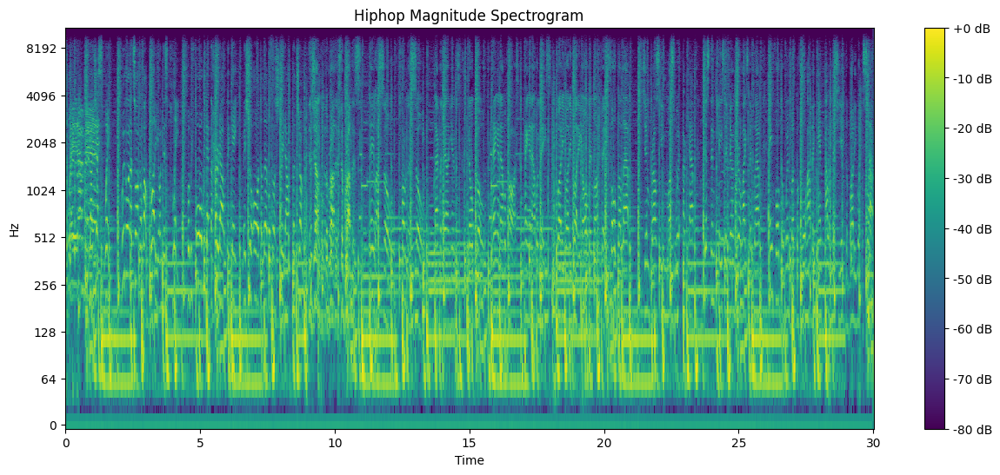

In [44]:
# Visualize Spectrograms
# Magnitude Spectrogram Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(data=hiphop_mag_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="log",
                         cmap="viridis") # Changed from 'magma'
plt.colorbar(format='%+2.0f dB')
plt.title("Hiphop Magnitude Spectrogram");

In [45]:
# Play Audio
ipd.Audio(hiphop_files[1])

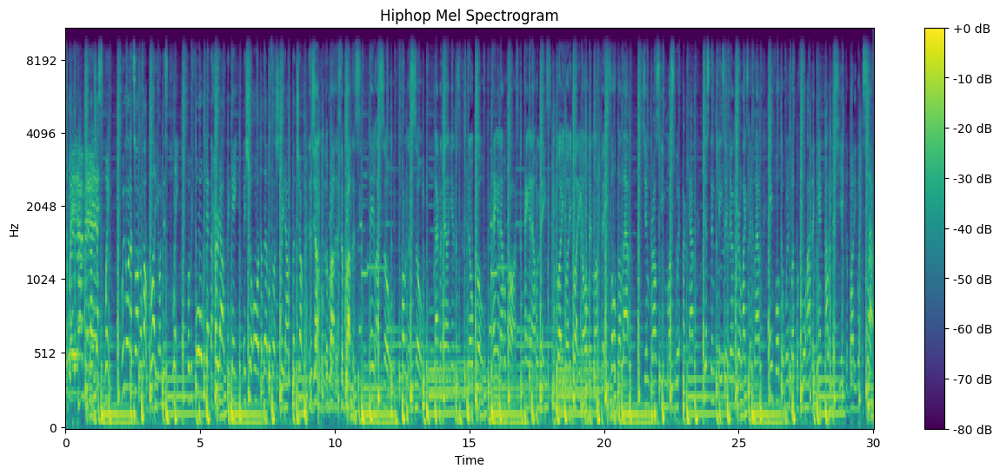

In [46]:
# Initiate Hiphop Mel Spectrogram
hiphop_mel_spec = librosa.feature.melspectrogram(y=y2, sr=22050, n_fft=2048, hop_length=512, n_mels=128)
# Scale to db
hiphop_mel_db = librosa.power_to_db(hiphop_mel_spec, ref=np.max)
# Mel Spectrogram Plot
plt.figure(figsize=(15, 6))
librosa.display.specshow(data=hiphop_mel_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis")
plt.colorbar(format='%+2.0f dB')
plt.title("Hiphop Mel Spectrogram");

<div style="font-size: 20px">Side-by-Side Mel Spectrogram Comparison</div>

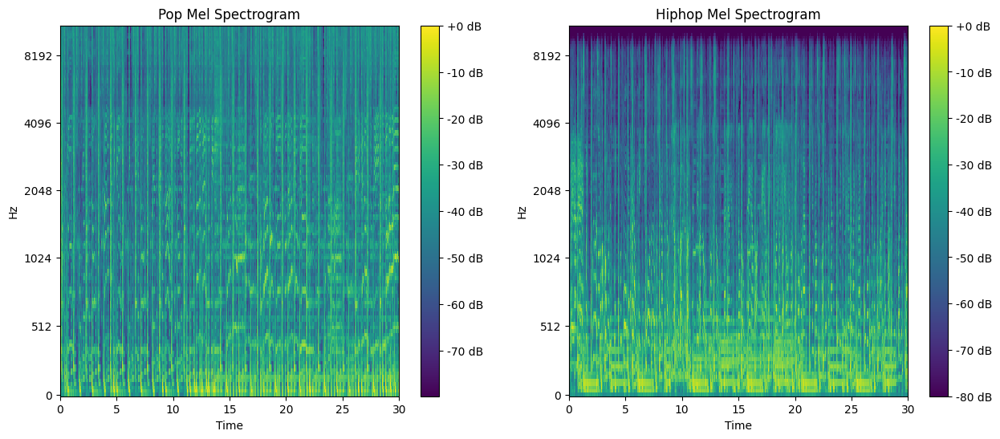

In [47]:
# Pop and Hiphop Mel Specs Comparison
fig, axs = plt.subplots(1, 2,figsize=(15, 6))
# Plot Pop Mel Spectrogram
img1 = librosa.display.specshow(data=mel_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis",
                         ax=axs[0])
axs[0].set_title("Pop Mel Spectrogram")
fig.colorbar(img1, ax=axs[0], format='%+2.0f dB');
# Plot Mel Spectrogram
img2 = librosa.display.specshow(data=hiphop_mel_db,
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis",
                         ax=axs[1])
axs[1].set_title("Hiphop Mel Spectrogram")
fig.colorbar(img2, ax=axs[1], format='%+2.0f dB');

In [48]:
# Instantiate 'Input' class. Classical as an example
classical = Input(filepath=classical_files[1])

In [49]:
# Load file function
classical.load_file()

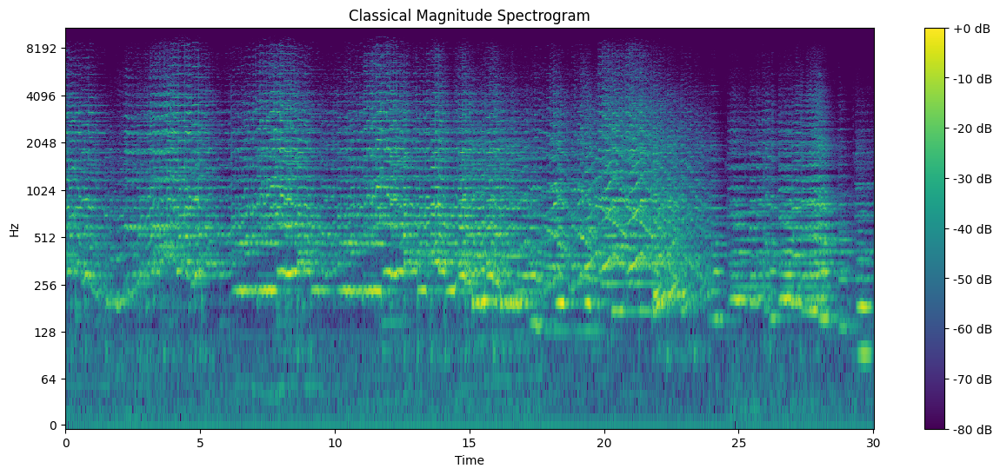

In [50]:
# Plot the Magnitude Spectrogram
classical.plot_mag_spec(genre="Classical")

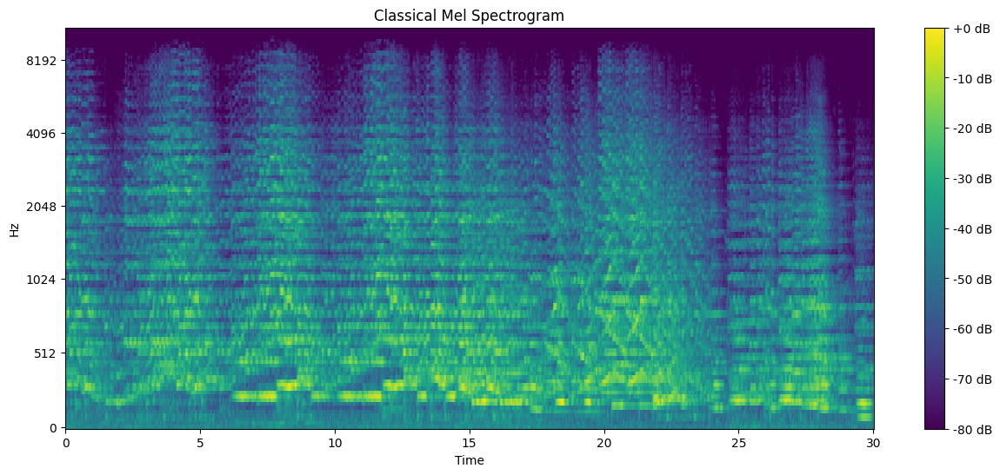

In [51]:
# Plot the Mel Spectrogram
classical.plot_mel_spec(genre="classical")

In [53]:
# Testing Genre Specs Comparison function
# Instantiate new genre
rock = Input(filepath=rock_files[1])

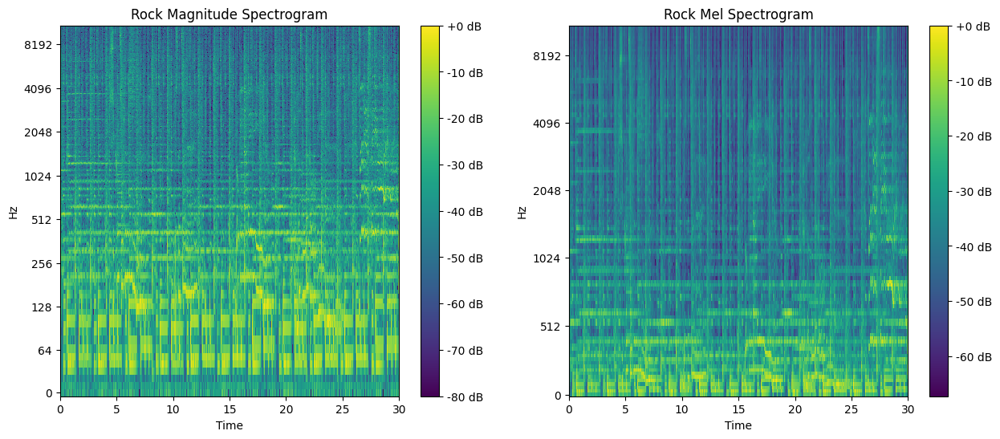

In [57]:
rock.plot_comparison_specs(genre="rock") # Works!!

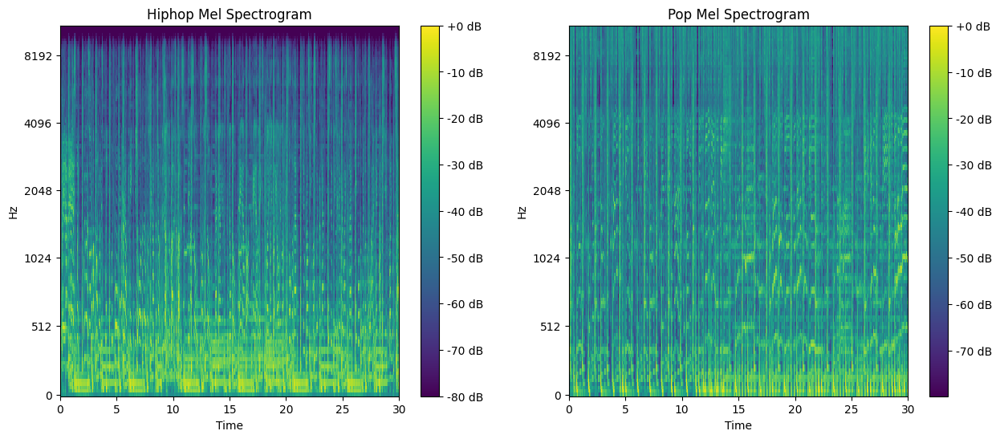

In [125]:
# Create unlimited number of comparison plots
genres = [{"hiphop": hiphop_mel_db}, {"Pop": mel_db}] # List specifying Genres
# print(list(genres[0].keys())[0]) # Get key
# print(type(np.array(list(genres[0].values())))) # Get value

fig, axs = plt.subplots(1, len(genres),figsize=(15, 6))
for i, genre in enumerate(genres):
    img1 = librosa.display.specshow(data=genres[i][f"{list(genre.keys())[0]}"],
                         sr=22050,
                         hop_length=512,
                         x_axis="time",
                         y_axis="mel",
                         cmap="viridis",
                         ax=axs[i])
    axs[i].set_title(f"{list(genre.keys())[0].title()} Mel Spectrogram")
    fig.colorbar(img1, ax=axs[i], format='%+2.0f dB');